In [1]:
import os
import sys
import hotspot
import anndata
import numpy as np
import pandas as pd
import hotspot
import matplotlib.pyplot as plt
import matplotlib.colors
import seaborn as sns
import mplscience
from scipy.io import mmread
from scipy.sparse import csr_matrix, csc_matrix
import scanpy as sc
import warnings; warnings.simplefilter('ignore')
import pickle5 as pickle
import mechanicalsoup
from time import time, sleep
import re
from datetime import datetime
import json
import itertools
from random import random

In [2]:
def method_in_2_lines(method):
    return method.replace(' (', '\n(')

In [3]:
def get_go_terms_from_dict(dictt, qval_thr=0.05):
    all_go_terms_for_dataset_method = list(itertools.chain.from_iterable(
                [dictt[clus][ontology] for ontology in ['proc', 'func', 'comp'] for clus in 
                 dictt.keys()]
            ))
    all_go_terms_for_dataset_method = [go_term for go_term in all_go_terms_for_dataset_method if '(' in go_term]
    go_terms = [(go_term[:go_term.find(' (qval')], float(go_term[go_term.find('qval')+4:-1])) for go_term in 
                all_go_terms_for_dataset_method]
    go_terms = [go for go in go_terms if go[1]<=qval_thr]
    
    # remove repeating GO terms
    go_names = [go[0] for go in go_terms]
    go_terms_unique = [go for go in go_terms if go_names.count(go[0])==1]
    for go_name in set([go[0] for go in go_terms if go_names.count(go[0])>1]):
        go_list = [go for go in go_terms if go[0]==go_name]
        best_pval = min([go[1] for go in go_list])
        go_terms_unique.append((go_name, best_pval))
            
    return go_terms_unique

In [4]:
dataset_dict = dict(zip([1, 3, 2, 5, 4, 6], 
                        ['lymphoblastoid cell line GM12891', 
                        'Zebrafish differentiation (7 time points)',
                        'sagittal-posterior section of a mouse brain',
                        'human prostate',
                        'human differentiation (days 0 and 7 − 21)',
                        'mouse B cells, treated with anti-IgM mAb (25 time points in the 6 hours post stimulation)'
                       ]))
dataset_type = dict(zip([1, 3, 2, 5, 4, 6], 
                        ['single cell', 'single cell', 
                        'spatial', 'spatial',
                        'bulk', 'bulk'
                       ]))

dataset_dict[20] = 'Slide-seqV2- diabetic kidney mouse'
dataset_type[20] = 'spatial'

dataset_dict[21] = 'Slide-seqV2- normal kidney mouse'
dataset_type[21] = 'spatial'

for data_n in range(61, 81):
    f = open("D:\\OneDrive - Technion\\SPIRAL\\static\\analysis\\data" + str(data_n) + "\\dataset_name.txt", 'r')
    name = f.readlines()[0]
    #print(name)
    f.close()
    
    dataset_dict[data_n] = 'mouse ' + name.replace('__', ' ')
    dataset_type[data_n] = 'spatial'
    

In [5]:
methods_dict = {'single cell': ['SPIRAL (Jaccard index=0.05)',
                                'SPIRAL (Jaccard index=0.5)',
                                'SPIRAL (Jaccard index=0.75)',
                                'Seurat',
                                'Slingshot+tradeSeq (nPoints=20)',
                                'Slingshot+tradeSeq (nPoints=200)',
                                "Hotspot (n_neighbors=30)",
                                "Hotspot (n_neighbors=300)",
                                'nsNMF',
                                'SingleCellHaystack (k=3)',
                                'SingleCellHaystack (k=5)'],
               'spatial':  ['SPIRAL (Jaccard index=0.05)',
                            'SPIRAL (Jaccard index=0.5)',
                            'SPIRAL (Jaccard index=0.75)',
                            'Seurat',
                            "Hotspot (n_neighbors=30)",
                            "Hotspot (n_neighbors=300)",
                            'nsNMF',
                            'SpatialDE (C=3)',
                            'SpatialDE (C=5)',
                            'SingleCellHaystack (k=3)',
                            'SingleCellHaystack (k=5)'],
               'bulk': ['SPIRAL (Jaccard index=0.05)',
                        'SPIRAL (Jaccard index=0.5)',
                        'SPIRAL (Jaccard index=0.75)',
                        'Seurat',
                        'nsNMF']}

In [6]:
go_folder = "comparison_of_all_methods_real_datasets\\GO_terms\\"

out_folder = "comparison_of_all_methods_real_datasets\\heatmaps\\"
if not os.path.exists(out_folder):
    os.mkdir(out_folder)

In [7]:
# read all dicts and filter by q-value
qval_thr = 0.01

all_GO_terms = dict()
for data_n in dataset_dict.keys():
    dataset = dataset_dict[data_n]
    typee = dataset_type[data_n]
    methods = methods_dict[typee]
    
    all_GO_terms[data_n] = dict()
    for method in methods:
        print(dataset, ',', typee, ',', method)
        if data_n in range(61, 81):
            if 'N' in dataset:
                dataset_ = 'mouse ' + dataset[dataset.find('N'):]
            elif 'B' in dataset:
                dataset_ = 'mouse ' + dataset[dataset.find('B'):]
            file = os.path.join(go_folder, dataset_ + ' - ' + method + ' - GO_terms.json')
        else:
            file = os.path.join(go_folder, dataset + ' - ' + method + ' - GO_terms.json')
        if os.path.exists(file):
            f = open(file)
            dictt = json.load(f)
            all_GO_terms[data_n][method] = get_go_terms_from_dict(dictt, qval_thr=qval_thr)
        else:
            print('NOTE: no file!')

all_GO_terms        

lymphoblastoid cell line GM12891 , single cell , SPIRAL (Jaccard index=0.05)
lymphoblastoid cell line GM12891 , single cell , SPIRAL (Jaccard index=0.5)
lymphoblastoid cell line GM12891 , single cell , SPIRAL (Jaccard index=0.75)
lymphoblastoid cell line GM12891 , single cell , Seurat
lymphoblastoid cell line GM12891 , single cell , Slingshot+tradeSeq (nPoints=20)
lymphoblastoid cell line GM12891 , single cell , Slingshot+tradeSeq (nPoints=200)
lymphoblastoid cell line GM12891 , single cell , Hotspot (n_neighbors=30)
lymphoblastoid cell line GM12891 , single cell , Hotspot (n_neighbors=300)
lymphoblastoid cell line GM12891 , single cell , nsNMF
lymphoblastoid cell line GM12891 , single cell , SingleCellHaystack (k=3)
lymphoblastoid cell line GM12891 , single cell , SingleCellHaystack (k=5)
Zebrafish differentiation (7 time points) , single cell , SPIRAL (Jaccard index=0.05)
Zebrafish differentiation (7 time points) , single cell , SPIRAL (Jaccard index=0.5)
Zebrafish differentiation (7

mouse AD_18 N04_E1 , spatial , SpatialDE (C=5)
mouse AD_18 N04_E1 , spatial , SingleCellHaystack (k=3)
mouse AD_18 N04_E1 , spatial , SingleCellHaystack (k=5)
mouse AD_18 N04_D1 , spatial , SPIRAL (Jaccard index=0.05)
mouse AD_18 N04_D1 , spatial , SPIRAL (Jaccard index=0.5)
mouse AD_18 N04_D1 , spatial , SPIRAL (Jaccard index=0.75)
mouse AD_18 N04_D1 , spatial , Seurat
mouse AD_18 N04_D1 , spatial , Hotspot (n_neighbors=30)
mouse AD_18 N04_D1 , spatial , Hotspot (n_neighbors=300)
mouse AD_18 N04_D1 , spatial , nsNMF
mouse AD_18 N04_D1 , spatial , SpatialDE (C=3)
mouse AD_18 N04_D1 , spatial , SpatialDE (C=5)
mouse AD_18 N04_D1 , spatial , SingleCellHaystack (k=3)
mouse AD_18 N04_D1 , spatial , SingleCellHaystack (k=5)
mouse AD_03 N03_D2 , spatial , SPIRAL (Jaccard index=0.05)
mouse AD_03 N03_D2 , spatial , SPIRAL (Jaccard index=0.5)
mouse AD_03 N03_D2 , spatial , SPIRAL (Jaccard index=0.75)
mouse AD_03 N03_D2 , spatial , Seurat
mouse AD_03 N03_D2 , spatial , Hotspot (n_neighbors=30)
m

NOTE: no file!
mouse WT_03 B02_E1 , spatial , SingleCellHaystack (k=5)
NOTE: no file!
mouse WT_03 B02_D1 , spatial , SPIRAL (Jaccard index=0.05)
NOTE: no file!
mouse WT_03 B02_D1 , spatial , SPIRAL (Jaccard index=0.5)
NOTE: no file!
mouse WT_03 B02_D1 , spatial , SPIRAL (Jaccard index=0.75)
NOTE: no file!
mouse WT_03 B02_D1 , spatial , Seurat
NOTE: no file!
mouse WT_03 B02_D1 , spatial , Hotspot (n_neighbors=30)
NOTE: no file!
mouse WT_03 B02_D1 , spatial , Hotspot (n_neighbors=300)
NOTE: no file!
mouse WT_03 B02_D1 , spatial , nsNMF
NOTE: no file!
mouse WT_03 B02_D1 , spatial , SpatialDE (C=3)
NOTE: no file!
mouse WT_03 B02_D1 , spatial , SpatialDE (C=5)
NOTE: no file!
mouse WT_03 B02_D1 , spatial , SingleCellHaystack (k=3)
NOTE: no file!
mouse WT_03 B02_D1 , spatial , SingleCellHaystack (k=5)
NOTE: no file!


{1: {'SPIRAL (Jaccard index=0.05)': [('GO:0006614:SRP-dependent cotranslational protein targeting to membrane',
    8.35e-146),
   ('GO:0006613:cotranslational protein targeting to membrane', 8.12e-142),
   ('GO:0006413:translational initiation', 7.66e-142),
   ('GO:0045047:protein targeting to ER', 9.13e-137),
   ('GO:0072599:establishment of protein localization to endoplasmic reticulum',
    2.75e-135),
   ('GO:0000184:nuclear-transcribed mRNA catabolic process, nonsense-mediated decay',
    4.26e-134),
   ('GO:0019083:viral transcription', 1.29e-131),
   ('GO:0070972:protein localization to endoplasmic reticulum', 2.3e-130),
   ('GO:0006612:protein targeting to membrane', 3.01e-123),
   ('GO:0000956:nuclear-transcribed mRNA catabolic process', 3.65e-113),
   ('GO:0006412:translation', 3.13e-112),
   ('GO:0006402:mRNA catabolic process', 1.9e-110),
   ('GO:0043043:peptide biosynthetic process', 1.25e-109),
   ('GO:0006401:RNA catabolic process', 9.49e-106),
   ('GO:0090150:establish

In [8]:
# filter by tinfo
from goatools.base import get_godag
from goatools.gosubdag.gosubdag import GoSubDag
from goatools.anno.factory import get_objanno
from goatools.semantic import TermCounts
from goatools.semantic import get_info_content

tinfo_thr = 9
#dcnt_thr = 0

godag = get_godag("go-basic.obo")

# Short alias, indicating species and the annotation filename
abc2gpad = {
    'hsa': 'goa_human.gpad',  # human
    'mmu': 'mgi.gpad',        # mouse
    'zfin': 'zfin.gpad'       #zebrafish
}

abc2objanno = {s:get_objanno(f, 'gpad', godag=godag) for s, f in abc2gpad.items()}
abc2objtcnt = {s:TermCounts(godag, o.get_id2gos_nss()) for s, o in abc2objanno.items()}

specific_GO_terms = dict()
for data_n in dataset_dict.keys():
    dataset = dataset_dict[data_n]
    typee = dataset_type[data_n]
    methods = methods_dict[typee]
    print(dataset, ',', typee, ',', method)
    
    if data_n in [1, 4, 5]: #human
        gpad_filename = abc2gpad['hsa']
    elif data_n in [3, ]: #zebrafish
        gpad_filename = abc2gpad['zfin']
    else: #mouse
        gpad_filename = abc2gpad['mmu']
    
    print('GPAD ANNOTATION FILENAME: {GPAD}'.format(GPAD=gpad_filename))
    annoobj = get_objanno(gpad_filename, 'gpad', godag=godag)
    id2goids = annoobj.get_id2gos_nss()
    tcntobj = TermCounts(godag, id2goids)
    
    specific_GO_terms[data_n] = dict()
    for method in methods:
        if method in all_GO_terms[data_n].keys():
            go_terms = all_GO_terms[data_n][method]
            gos = set([g[0][:([i for i,c in enumerate(g[0]) if c==':'][1])] for g in go_terms])
            print('Starting with ', len(gos), 'GO terms')
            if not gos:
                specific_GO_terms[data_n][method] = []
            else:    
                gosubdag = GoSubDag(gos, godag, tcntobj=tcntobj)
                found_gos = set(gosubdag.go2nt.keys()).intersection(set(gos))
                print('\nfound', len(found_gos), 'GO terms out of ', len(gos))
                if not found_gos:
                    specific_GO_terms[data_n][method] = []
                else:
                    nts = [gosubdag.go2nt[go] for go in found_gos]                    
                    final_go_list = [(nt.GO + ':' + nt.GO_name, [g for g in go_terms if nt.GO in g[0]][0][1], nt.tinfo) 
                                     for nt in nts if nt.tinfo>=tinfo_thr]
                    print('down to', len(final_go_list), 'with tinfo>=', tinfo_thr)                    
                    specific_GO_terms[data_n][method] = final_go_list
specific_GO_terms

  EXISTS: go-basic.obo
go-basic.obo: fmt(1.2) rel(2023-03-06) 46,579 Terms
HMS:0:00:17.718130 626,162 annotations READ: goa_human.gpad 
HMS:0:00:13.957532 514,558 annotations READ: mgi.gpad 
HMS:0:00:11.097748 260,095 annotations READ: zfin.gpad 
lymphoblastoid cell line GM12891 , single cell , SingleCellHaystack (k=5)
GPAD ANNOTATION FILENAME: goa_human.gpad
HMS:0:00:26.196595 626,162 annotations READ: goa_human.gpad 
Starting with  1133 GO terms
51 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0022610 GO:0044265 GO:0044432 GO:0044431 GO:0044459 GO:0044422 GO:0060968 GO:0031224 GO:0044440 GO:0097458 GO:0044260 GO:0006733 GO:0018196 GO:0044454 GO:0042769 GO:0044455 GO:2000113 GO:0031227 GO:0070035 GO:0044421 GO:0044456 GO:0051704 GO:0043486 GO:0009108 GO:0008144 GO:0051186 GO:0006732 GO:0044433 GO:0044425 GO:0055114 GO:0044428 GO:0044437 GO:0051270 GO:0006928 GO:0044424 GO:0005924 GO:0030176 GO:0044444 GO:0044445 GO:0031226 GO:0044427 GO:0034645 GO:0044446 GO:0051188 GO:0044451 GO:0071556 

HMS:0:00:13.435563 260,095 annotations READ: zfin.gpad 
Starting with  459 GO terms
24 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0071426 GO:0044265 GO:0044422 GO:0044260 GO:0016676 GO:0044454 GO:0044455 GO:0070035 GO:0015002 GO:0044428 GO:0044424 GO:0005924 GO:2000112 GO:0044444 GO:0044427 GO:0044445 GO:0071428 GO:0034645 GO:0044446 GO:0044451 GO:0044430 GO:0044452 GO:0044429
 GoSubDag: 435 sources in 607 GOs rcnt(True). 14 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 435 GO terms out of  459
down to 12 with tinfo>= 9
Starting with  980 GO terms
37 GO IDs NOT FOUND IN GO DAG: GO:0071426 GO:0044265 GO:0044464 GO:0016584 GO:0060968 GO:0044422 GO:0043900 GO:0044260 GO:0016676 GO:0044454 GO:2000113 GO:0070035 GO:0044455 GO:0016681 GO:0008144 GO:0044425 GO:0055114 GO:0015002 GO:0031936 GO:0060969 GO:0031935 GO:0044428 GO:0044424 GO:0005924 GO:0043902 GO:2000112 GO:0044444 GO:0044427 GO:0044445 GO:00

79 GO IDs NOT FOUND IN GO DAG: GO:0046939 GO:0044464 GO:0098936 GO:0031058 GO:0099055 GO:0099061 GO:0099699 GO:0016458 GO:0044260 GO:2000113 GO:0031227 GO:0008144 GO:0030004 GO:0035637 GO:0051270 GO:0006928 GO:0031300 GO:0051181 GO:0051271 GO:2000112 GO:0018024 GO:0044427 GO:0034645 GO:0044430 GO:0072503 GO:0044429 GO:0022610 GO:0044265 GO:0099144 GO:0120038 GO:0044422 GO:0099056 GO:0099060 GO:0099059 GO:0044421 GO:0098945 GO:0044433 GO:0055114 GO:0044449 GO:0098889 GO:0006757 GO:0008022 GO:0044445 GO:0098948 GO:0044431 GO:0047485 GO:0031224 GO:0006733 GO:0051705 GO:0044420 GO:0072507 GO:0044425 GO:0030285 GO:0044463 GO:0099240 GO:0031225 GO:0044444 GO:0033267 GO:0031226 GO:0044451 GO:0006165 GO:0044432 GO:0044459 GO:0097458 GO:0099146 GO:0044455 GO:0006875 GO:0044456 GO:0031301 GO:2001020 GO:0044428 GO:0044424 GO:0030176 GO:0051272 GO:0044448 GO:0044446 GO:0016569 GO:0055065 GO:0098563
 GoSubDag: 1561 sources in 1811 GOs rcnt(True). 25 alt GO IDs
 GoSubDag: namedtuple fields: NS level

 GoSubDag: 998 sources in 1289 GOs rcnt(True). 16 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 998 GO terms out of  1027
down to 9 with tinfo>= 9
Starting with  641 GO terms
25 GO IDs NOT FOUND IN GO DAG: GO:0022610 GO:0044431 GO:0044459 GO:0044422 GO:0043900 GO:0031224 GO:0044440 GO:2000113 GO:0031227 GO:0044421 GO:0044420 GO:0044433 GO:0044425 GO:0044437 GO:0051270 GO:0044449 GO:0006928 GO:0005924 GO:0030176 GO:0051271 GO:2000112 GO:0044444 GO:0031226 GO:0071556 GO:0044430
 GoSubDag: 616 sources in 810 GOs rcnt(True). 9 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 616 GO terms out of  641
down to 13 with tinfo>= 9
Starting with  372 GO terms
17 GO IDs NOT FOUND IN GO DAG: GO:0031227 GO:0022610 GO:0044421 GO:0044437 GO:0051270 GO:0044459 GO:0044422 GO:0006928 GO:0051704 GO:0005924 GO:0030176 GO:0044449

 GoSubDag: 1503 sources in 1810 GOs rcnt(True). 25 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 1503 GO terms out of  1547
down to 2 with tinfo>= 9
Starting with  1770 GO terms
51 GO IDs NOT FOUND IN GO DAG: GO:0051817 GO:0044464 GO:0044265 GO:0044431 GO:0120038 GO:0044459 GO:0044422 GO:0043900 GO:0016458 GO:0097458 GO:0044260 GO:0044454 GO:1902579 GO:0044455 GO:2000113 GO:0090723 GO:0044456 GO:0032592 GO:2001021 GO:0044766 GO:0008144 GO:0050662 GO:0051186 GO:2001020 GO:0044425 GO:0055114 GO:0044463 GO:0044428 GO:0044437 GO:0051270 GO:0006928 GO:0044424 GO:0005924 GO:0051272 GO:0048037 GO:0031057 GO:2000112 GO:0033267 GO:0044444 GO:0044450 GO:0018024 GO:0044445 GO:0044427 GO:0044446 GO:0034645 GO:0016569 GO:0051188 GO:0044451 GO:0044430 GO:0044452 GO:0044429
 GoSubDag: 1719 sources in 2048 GOs rcnt(True). 29 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfr

 GoSubDag:  30 sources in 125 GOs rcnt(True). 6 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 30 GO terms out of  31
down to 0 with tinfo>= 9
Starting with  263 GO terms
20 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0044422 GO:0044260 GO:0006733 GO:0044438 GO:0044455 GO:0009108 GO:0044439 GO:0051186 GO:0050662 GO:0006732 GO:0055114 GO:0044428 GO:0044424 GO:0030176 GO:0048037 GO:0044444 GO:0044446 GO:0051188 GO:0044429
 GoSubDag: 243 sources in 357 GOs rcnt(True). 5 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 243 GO terms out of  263
down to 1 with tinfo>= 9
Starting with  302 GO terms
18 GO IDs NOT FOUND IN GO DAG: GO:0044438 GO:0044444 GO:0044455 GO:0044464 GO:0055114 GO:0044439 GO:0044428 GO:0044446 GO:0044422 GO:0044424 GO:0051188 GO:0048037 GO:0009108 GO:0006733 GO:0051186 GO:0050662 GO:0006732 GO:00

 GoSubDag: 628 sources in 818 GOs rcnt(True). 11 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 628 GO terms out of  664
down to 7 with tinfo>= 9
Starting with  619 GO terms
35 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0098936 GO:0099055 GO:0120038 GO:0044459 GO:0099056 GO:0099060 GO:0099061 GO:0099699 GO:0097458 GO:0099059 GO:0099146 GO:0051705 GO:0006875 GO:0044456 GO:0098945 GO:0072507 GO:0044433 GO:0030004 GO:0030285 GO:0055067 GO:0044463 GO:0099240 GO:0051270 GO:0006928 GO:0044424 GO:0098889 GO:0044448 GO:0044444 GO:0033267 GO:0008022 GO:0031226 GO:0098948 GO:0055065 GO:0072503
 GoSubDag: 584 sources in 777 GOs rcnt(True). 11 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 584 GO terms out of  619
down to 3 with tinfo>= 9
Starting with  1118 GO terms
57 GO IDs NOT FOUND IN GO DAG: GO:0046939 GO:0044464 

 GoSubDag: 1612 sources in 1810 GOs rcnt(True). 29 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 1612 GO terms out of  1691
down to 5 with tinfo>= 9
Starting with  1542 GO terms
73 GO IDs NOT FOUND IN GO DAG: GO:0046939 GO:0044464 GO:0022610 GO:0098936 GO:0044265 GO:0044432 GO:0044431 GO:0099055 GO:0044459 GO:0044422 GO:0047485 GO:0099056 GO:0098993 GO:0099060 GO:0099061 GO:0099699 GO:0044440 GO:0097458 GO:0120038 GO:0044260 GO:0006733 GO:0099146 GO:0016676 GO:0055076 GO:0044455 GO:0006875 GO:0044421 GO:0044456 GO:0032592 GO:0031301 GO:0044441 GO:0009108 GO:0008144 GO:0051186 GO:0006732 GO:0044433 GO:2000574 GO:0030285 GO:0044425 GO:0055114 GO:0044463 GO:0015002 GO:0044428 GO:0044437 GO:0051270 GO:0098573 GO:0099240 GO:0006928 GO:0044424 GO:0031300 GO:0051272 GO:0031225 GO:0098889 GO:0051271 GO:0044448 GO:0044444 GO:0033267 GO:0006757 GO:0008022 GO:0000188 GO:0044445 GO:0031226 GO:0044446 GO:003

78 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0098936 GO:0099055 GO:0098993 GO:0099061 GO:0099699 GO:0044440 GO:0044260 GO:0031227 GO:0016681 GO:0008144 GO:0006732 GO:0035637 GO:0051270 GO:0006928 GO:0031300 GO:0051271 GO:0000187 GO:0046658 GO:0034645 GO:0044430 GO:0072503 GO:0044429 GO:0022610 GO:0099144 GO:0120038 GO:0044422 GO:0099056 GO:0099060 GO:0099059 GO:0016676 GO:0044421 GO:0098945 GO:0051186 GO:0050662 GO:0044433 GO:0055114 GO:0044437 GO:0044449 GO:0099031 GO:0098889 GO:0008022 GO:0044445 GO:0098948 GO:0047485 GO:0031224 GO:0051705 GO:0072507 GO:0044425 GO:0030285 GO:0044463 GO:0015002 GO:0099240 GO:0031225 GO:0044444 GO:0033267 GO:0031226 GO:0099030 GO:0044432 GO:0010872 GO:0044459 GO:0097458 GO:0099146 GO:0044455 GO:0006875 GO:0044456 GO:0031301 GO:0055067 GO:0044428 GO:0044424 GO:0030176 GO:0051272 GO:0048037 GO:0044448 GO:0044446 GO:0055065 GO:0099025 GO:0098563
 GoSubDag: 1405 sources in 1609 GOs rcnt(True). 24 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO a

 GoSubDag: 136 sources in 215 GOs rcnt(True). 2 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 136 GO terms out of  158
down to 2 with tinfo>= 9
Starting with  262 GO terms
24 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0098936 GO:0099055 GO:0120038 GO:0044459 GO:0047485 GO:0099056 GO:0099699 GO:0097458 GO:0006875 GO:0044456 GO:0072507 GO:0044433 GO:0044425 GO:0044463 GO:0099240 GO:0044424 GO:0098889 GO:0044444 GO:0033267 GO:0031226 GO:0044446 GO:0055065 GO:0072503
 GoSubDag: 238 sources in 323 GOs rcnt(True). 8 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 238 GO terms out of  262
down to 0 with tinfo>= 9
Starting with  1563 GO terms
70 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0022610 GO:0098936 GO:0044265 GO:0099055 GO:0044431 GO:0010872 GO:0044459 GO:0044422 GO:0047485 GO:0099056 GO:0098993 GO:0099060 GO

 GoSubDag: 841 sources in 1072 GOs rcnt(True). 18 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 841 GO terms out of  889
down to 2 with tinfo>= 9
Starting with  308 GO terms
27 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0120038 GO:0044459 GO:0044422 GO:0099056 GO:0099060 GO:0099699 GO:0097458 GO:0044260 GO:0044421 GO:0044456 GO:0044216 GO:0044433 GO:0055069 GO:0044463 GO:0044437 GO:0099240 GO:0006928 GO:0044424 GO:0098889 GO:0044444 GO:0033267 GO:0044445 GO:0044446 GO:0034645 GO:0098948 GO:0098563
 GoSubDag: 281 sources in 441 GOs rcnt(True). 1 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 281 GO terms out of  308
down to 2 with tinfo>= 9
Starting with  305 GO terms
23 GO IDs NOT FOUND IN GO DAG: GO:0098936 GO:0099055 GO:0120038 GO:0044459 GO:0099061 GO:0099699 GO:0097458 GO:0099146 GO:0044421 GO:0044456 G

 GoSubDag: 825 sources in 1070 GOs rcnt(True). 18 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 825 GO terms out of  875
down to 2 with tinfo>= 9
Starting with  483 GO terms
35 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0098936 GO:0099055 GO:0120038 GO:0044459 GO:0099056 GO:0099060 GO:0099061 GO:0099699 GO:0044440 GO:0097458 GO:0044260 GO:0099059 GO:0099146 GO:0044455 GO:0006875 GO:0044421 GO:0044456 GO:0098945 GO:0072507 GO:0044216 GO:0044433 GO:0044447 GO:0044463 GO:0099240 GO:0098889 GO:0044448 GO:0006757 GO:0033267 GO:0044444 GO:0044445 GO:0034645 GO:0098948 GO:0055065 GO:0072503
 GoSubDag: 448 sources in 662 GOs rcnt(True). 7 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 448 GO terms out of  483
down to 1 with tinfo>= 9
Starting with  432 GO terms
35 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0098936 G

 GoSubDag: 945 sources in 1211 GOs rcnt(True). 19 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 945 GO terms out of  993
down to 1 with tinfo>= 9
Starting with  482 GO terms
36 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0098936 GO:0099055 GO:0120038 GO:0010872 GO:0044459 GO:0044422 GO:0099056 GO:0099060 GO:0099699 GO:0097458 GO:0044260 GO:0044455 GO:0044421 GO:0044456 GO:0044433 GO:0044425 GO:0030285 GO:0044463 GO:0015002 GO:0099240 GO:0051270 GO:0006928 GO:0044424 GO:0098889 GO:0044448 GO:0010873 GO:0044444 GO:0033267 GO:0031226 GO:0044445 GO:0044446 GO:0034645 GO:0098948 GO:0098563 GO:0044429
 GoSubDag: 446 sources in 677 GOs rcnt(True). 4 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 446 GO terms out of  482
down to 2 with tinfo>= 9
Starting with  292 GO terms
28 GO IDs NOT FOUND IN GO DAG: GO:0044464 G

 GoSubDag: 151 sources in 224 GOs rcnt(True). 1 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 151 GO terms out of  174
down to 1 with tinfo>= 9
Starting with  1076 GO terms
57 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0022610 GO:0098936 GO:0099144 GO:0099055 GO:0120038 GO:0044459 GO:0044422 GO:0047485 GO:0099056 GO:0099060 GO:0099061 GO:0099699 GO:0031224 GO:0097458 GO:0099059 GO:0099146 GO:0016676 GO:0044455 GO:0051705 GO:0006875 GO:0044421 GO:0044456 GO:0031301 GO:0098945 GO:0072507 GO:0044433 GO:0044425 GO:0030285 GO:0035637 GO:0044463 GO:0015002 GO:0044437 GO:0099240 GO:0044449 GO:0051270 GO:0006928 GO:0044424 GO:0031300 GO:0099031 GO:0031225 GO:0098889 GO:0044448 GO:0044444 GO:0033267 GO:0008022 GO:0044445 GO:0046658 GO:0031226 GO:0034645 GO:0099030 GO:0098948 GO:0055065 GO:0099025 GO:0098563 GO:0072503 GO:0044429
 GoSubDag: 1019 sources in 1253 GOs rcnt(True). 16 alt GO IDs
 GoSubDag: name

 GoSubDag: 1150 sources in 1401 GOs rcnt(True). 20 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 1150 GO terms out of  1208
down to 2 with tinfo>= 9
Starting with  804 GO terms
45 GO IDs NOT FOUND IN GO DAG: GO:0046939 GO:0044464 GO:0098936 GO:0099055 GO:0120038 GO:0044459 GO:0044422 GO:0099056 GO:0099699 GO:0097458 GO:0044260 GO:0006733 GO:0016676 GO:0044455 GO:0006875 GO:0044456 GO:0072507 GO:0009108 GO:0044433 GO:0030004 GO:0030285 GO:0044425 GO:0055114 GO:0044463 GO:0015002 GO:0099240 GO:0051270 GO:0006928 GO:0044424 GO:0051272 GO:0098889 GO:0006757 GO:0033267 GO:0044444 GO:0044445 GO:0044446 GO:0034645 GO:0051188 GO:0055065 GO:0098563 GO:0044430 GO:0072503 GO:0006165 GO:0044429 GO:0046916
 GoSubDag: 759 sources in 960 GOs rcnt(True). 14 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 759 GO terms out o

HMS:0:00:13.777947 514,558 annotations READ: mgi.gpad 
Starting with  1430 GO terms
75 GO IDs NOT FOUND IN GO DAG: GO:0044464 GO:0044265 GO:0098936 GO:0044432 GO:0044431 GO:0010872 GO:0044459 GO:0044422 GO:0047485 GO:0099056 GO:0098993 GO:0099060 GO:0099061 GO:0099699 GO:0044440 GO:0099055 GO:0097458 GO:0120038 GO:0044260 GO:0006733 GO:0099146 GO:0016676 GO:0044455 GO:0031227 GO:0006875 GO:0044421 GO:0090723 GO:0044456 GO:0031301 GO:0044441 GO:0072507 GO:0009108 GO:0016681 GO:0008144 GO:0006732 GO:0044433 GO:0030004 GO:0030285 GO:0051186 GO:0044425 GO:0035637 GO:0055114 GO:0055067 GO:0044463 GO:0061732 GO:0015002 GO:0044428 GO:0044449 GO:0051270 GO:0044437 GO:0006928 GO:0044424 GO:0099240 GO:0030176 GO:0051272 GO:0031300 GO:0048037 GO:0098889 GO:0051271 GO:0044448 GO:0010873 GO:0044444 GO:0033267 GO:0008022 GO:0044445 GO:0031226 GO:0044446 GO:0034645 GO:0051188 GO:0098948 GO:0055065 GO:0098563 GO:0044430 GO:0072503 GO:0044429
 GoSubDag: 1355 sources in 1620 GOs rcnt(True). 23 alt GO ID

 GoSubDag: 111 sources in 188 GOs rcnt(True). 1 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 111 GO terms out of  124
down to 0 with tinfo>= 9
Starting with  1215 GO terms
59 GO IDs NOT FOUND IN GO DAG: GO:0046939 GO:0044464 GO:0022610 GO:0098936 GO:0099055 GO:0120038 GO:0044459 GO:0044422 GO:0047485 GO:0099056 GO:0098993 GO:0099060 GO:0099061 GO:0099699 GO:0044440 GO:0097458 GO:0099059 GO:0044260 GO:0099146 GO:0016676 GO:0044455 GO:0051705 GO:0006875 GO:0044421 GO:0090723 GO:0044456 GO:0031301 GO:0098945 GO:0072507 GO:0044433 GO:0044425 GO:0030285 GO:0044463 GO:0015002 GO:0044437 GO:0099240 GO:0044449 GO:0051270 GO:0006928 GO:0044424 GO:0031300 GO:0051272 GO:0031225 GO:0098889 GO:0044448 GO:0044444 GO:0033267 GO:0008022 GO:0044445 GO:0031226 GO:0044446 GO:0034645 GO:0098948 GO:0055065 GO:0098563 GO:0044430 GO:0072503 GO:0006165 GO:0044429
 GoSubDag: 1156 sources in 1347 GOs rcnt(True). 23 alt 

 GoSubDag: 778 sources in 983 GOs rcnt(True). 17 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 778 GO terms out of  830
down to 6 with tinfo>= 9
Starting with  1146 GO terms
62 GO IDs NOT FOUND IN GO DAG: GO:0046939 GO:0044464 GO:0098936 GO:0099144 GO:0099055 GO:0120038 GO:0044459 GO:0044422 GO:0099056 GO:0098993 GO:0099061 GO:0099699 GO:0097458 GO:0099059 GO:0006733 GO:0044260 GO:0099146 GO:0016676 GO:0044455 GO:0051705 GO:0006875 GO:0090723 GO:0044456 GO:0031301 GO:0098945 GO:0072507 GO:0008144 GO:0044433 GO:0030004 GO:0030285 GO:0044425 GO:0055114 GO:0055067 GO:0044463 GO:0015002 GO:0044437 GO:0099240 GO:0051270 GO:0006928 GO:0044424 GO:0031300 GO:0099031 GO:0098889 GO:0051271 GO:0044448 GO:0044444 GO:0033267 GO:0006757 GO:0008022 GO:0044445 GO:0044446 GO:0034645 GO:0099030 GO:0098948 GO:0055065 GO:0099025 GO:0098563 GO:0044430 GO:0072503 GO:0006165 GO:0044429 GO:0046916
 GoSubDag: 1084 sourc

 GoSubDag: 838 sources in 1040 GOs rcnt(True). 19 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 tcnt tfreq tinfo id
 GoSubDag: relationships: set()

found 838 GO terms out of  888
down to 3 with tinfo>= 9
mouse WT_18 B04_E1 , spatial , SingleCellHaystack (k=5)
GPAD ANNOTATION FILENAME: mgi.gpad
HMS:0:00:12.970810 514,558 annotations READ: mgi.gpad 
Starting with  1548 GO terms
79 GO IDs NOT FOUND IN GO DAG: GO:0046939 GO:0044464 GO:0098936 GO:0099055 GO:0099061 GO:0099699 GO:0044440 GO:0044260 GO:0032592 GO:0016681 GO:0008144 GO:0006732 GO:0030004 GO:0035637 GO:0061732 GO:0051270 GO:0006928 GO:0031300 GO:0034645 GO:0044430 GO:0072503 GO:0044429 GO:0046916 GO:0022610 GO:0099144 GO:0120038 GO:0044422 GO:0099056 GO:0099060 GO:0099059 GO:0016676 GO:0055076 GO:0044421 GO:0090723 GO:0098945 GO:0051186 GO:0044433 GO:0055114 GO:0044437 GO:0098573 GO:0044449 GO:0098889 GO:0006757 GO:0008022 GO:0044445 GO:0098948 GO:0031224 GO:0006733 GO:0051705 GO:0072507 GO:000

{1: {'SPIRAL (Jaccard index=0.05)': [('GO:0097711:ciliary basal body-plasma membrane docking',
    0.00628,
    9.75944395695215),
   ('GO:0038114:interleukin-21-mediated signaling pathway',
    5.86e-05,
    9.75944395695215),
   ('GO:0016999:antibiotic metabolic process', 0.00551, 9.75944395695215),
   ('GO:0002479:antigen processing and presentation of exogenous peptide antigen via MHC class I, TAP-dependent',
    0.00164,
    9.75944395695215),
   ('GO:0038113:interleukin-9-mediated signaling pathway',
    0.00475,
    9.75944395695215),
   ('GO:0036502:Derlin-1-VIMP complex', 0.00634, 9.128533609272091)],
  'SPIRAL (Jaccard index=0.5)': [('GO:0097711:ciliary basal body-plasma membrane docking',
    0.00628,
    9.75944395695215),
   ('GO:0038114:interleukin-21-mediated signaling pathway',
    5.86e-05,
    9.75944395695215),
   ('GO:0002480:antigen processing and presentation of exogenous peptide antigen via MHC class I, TAP-independent',
    0.000858,
    9.75944395695215),
   ('

20 Slide-seqV2- diabetic kidney mouse 1


21 Slide-seqV2- normal kidney mouse 3


61 mouse AD_06 N07_C1 19


62 mouse AD_12 N06_D2 13


63 mouse AD_18 N05_D2 18


64 mouse AD_18 N05_C2 11


65 mouse AD_18 N04_E1 16


66 mouse AD_18 N04_D1 11


67 mouse AD_03 N03_D2 14


68 mouse AD_03 N03_C2 15


69 mouse AD_03 N02_D1 17


70 mouse AD_03 N02_C1 17


71 mouse WT_06 B07_C2 15


72 mouse WT_12 B06_E1 6


73 mouse WT_18 B05_E2 13


74 mouse WT_18 B05_D2 9


75 mouse WT_18 B04_E1 7




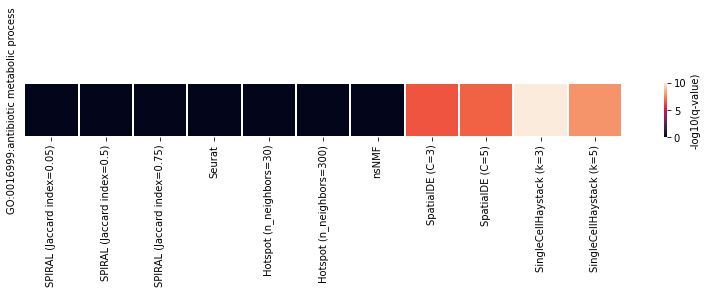

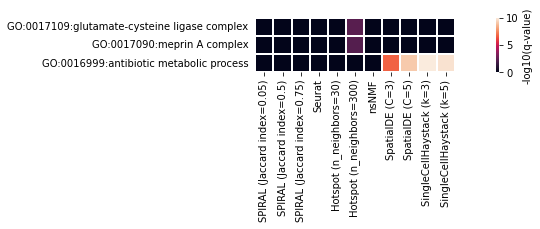

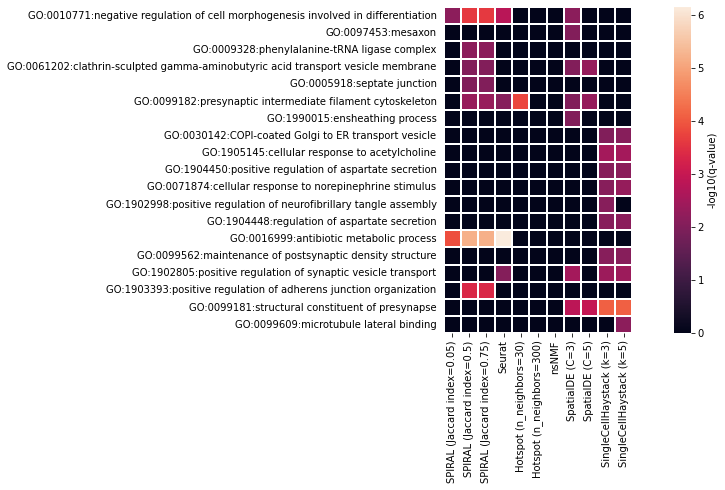

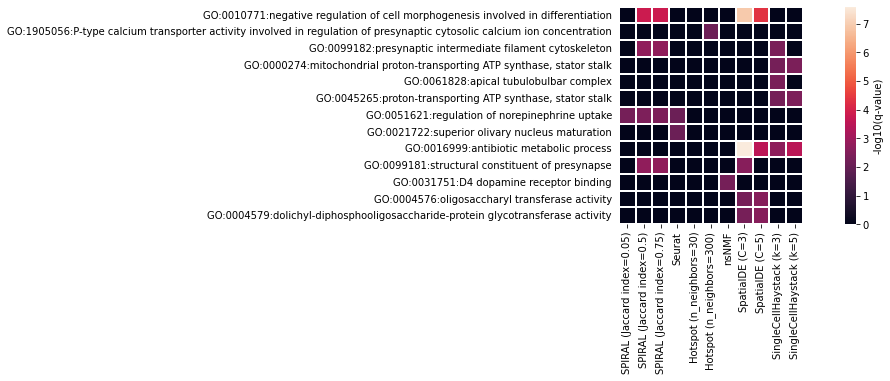

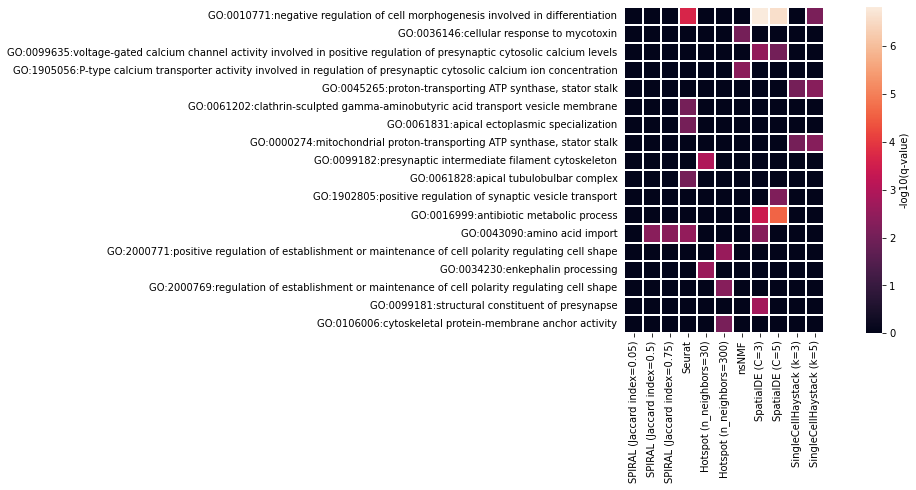

...

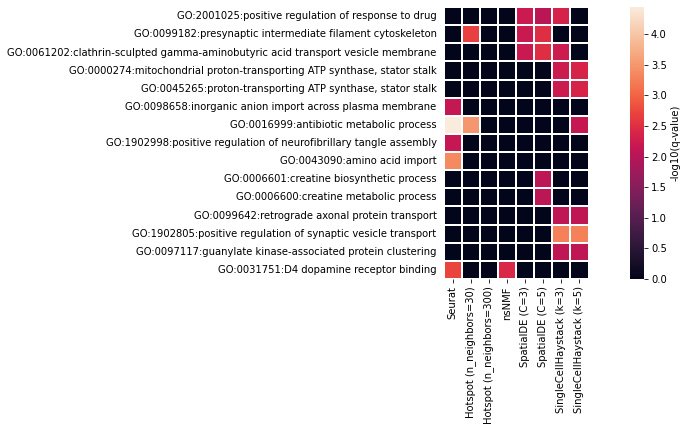

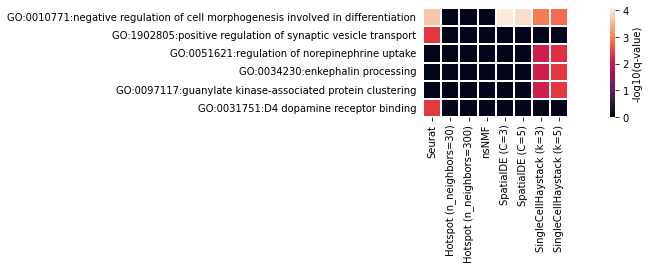

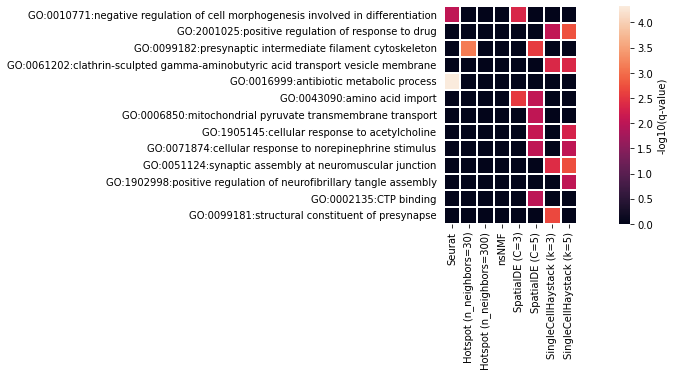

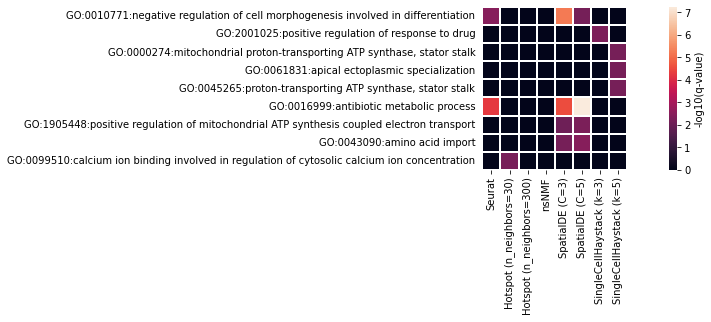

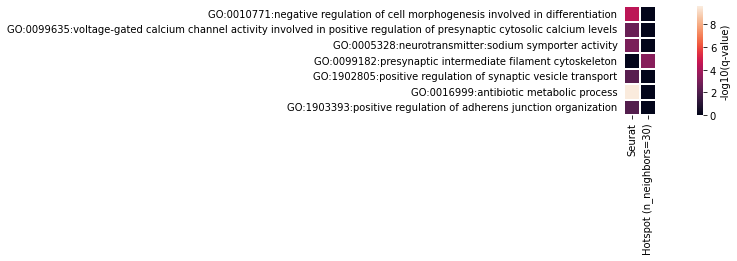

In [9]:
# create heatmaps
max_colorbar = 10
for data_n in list(specific_GO_terms.keys()):
    if specific_GO_terms[data_n]:
        out_file_jpg = os.path.join(out_folder, 
                                     dataset_dict[data_n] + '_tinfo' + str(tinfo_thr) + '_qval' + str(qval_thr) + '.jpg')
        out_file_eps = os.path.join(out_folder,  
                                     dataset_dict[data_n] + '_tinfo' + str(tinfo_thr) + '_qval' + str(qval_thr) + '.eps')
        if not os.path.exists(out_file_jpg) or not os.path.exists(out_file_eps):
            methods_ = list(specific_GO_terms[data_n].keys())

            # create one GO terms table with the p-values of every method for every GO term
            go_terms_table = pd.DataFrame(columns=['go', 'tinfo'])
            for method in methods_:
                go_term_list = specific_GO_terms[data_n][method]
                go_terms_table_method = pd.DataFrame(columns=['go', method, 'tinfo'])
                go_terms_table_method.loc[:, 'go'] = [g[0] for g in go_term_list]
                go_terms_table_method.loc[:, method] = [g[1] for g in go_term_list]
                go_terms_table_method.loc[:, 'tinfo'] = [g[2] for g in go_term_list]
                if len(go_terms_table_method) > 0:
                    go_terms_table = go_terms_table.merge(go_terms_table_method, how='outer', on=['go', 'tinfo'])
                else:
                    go_terms_table.insert(0, method, [1]*len(go_terms_table))
            go_terms_table = go_terms_table.fillna(1)
            go_terms_table = go_terms_table.sort_values(by='tinfo', ascending=False)
            go_terms_table.index = go_terms_table.go
            go_terms_table = go_terms_table.drop(['go'], axis=1)
            go_terms_table.index.name = None

            # reorder columns
            go_terms_table = go_terms_table.loc[:, ['tinfo'] + methods_]
            print(data_n, dataset_dict[data_n], len(go_terms_table))

            # create heatmap
            go_terms_table = go_terms_table.drop("tinfo", axis=1)
            go_terms_table = go_terms_table[go_terms_table.columns].astype(float)

            if len(go_terms_table) > 0:
                plt.figure(figsize=(15, max(len(go_terms_table)//3, 1)))
                ax = sns.heatmap(go_terms_table.applymap(lambda x: min(-np.log10(x), max_colorbar)), 
                                 annot=False, fmt='.2f', xticklabels=methods_, yticklabels=True, 
                                 linecolor='white', linewidth=0.2, cbar_kws={'label': '-log10(q-value)'}, square=True)
                ax.tick_params(left=False)
                #val_vec = list([aa[1] for aa in a])
                #ax.hlines([sum(val_vec[:(i+1)]) for i,v in enumerate(val_vec)], *ax.get_xlim(), colors='green', linewidths=0.5)
                #ax.vlines(range(1, len(methods_)), *ax.get_ylim(), colors='green', linewidths=0.5)
                plt.savefig(out_file_jpg, bbox_inches = "tight")
                plt.savefig(out_file_eps, bbox_inches = "tight", format='eps')
                #plt.show()
            print('\n')
